## Library imports

In [1]:
import numpy as np
import torch
import torchvision
import torchvision.datasets as datasets
from torchvision.transforms import ToTensor
from torch.utils.data import DataLoader
from torchvision import transforms
from tqdm.auto import tqdm
from tqdm import trange
from tqdm.utils import disp_trim
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

import torch.nn.functional as F
from torch import nn
import math

from inspect import isfunction
from functools import partial

!pip install -q -U einops

from einops import rearrange
from torch import nn, einsum

from torch.optim import Adam, SGD
import pandas as pd

     |████████████████████████████████| 41 kB 27 kB/s 


In [2]:
from google.colab import drive
# connect to drive
drive.mount('/content/drive')
!ls
import os
os.chdir('drive/MyDrive/IASD/DS/Diffusion')

Mounted at /content/drive
drive  sample_data


## Hyperparams

In [3]:
BATCH_SIZE = 128
IMG_SIZE = 32
T = 800
s = 0.002 # smallest value to add noise for cosine schedule at first step for T=800
beta_min = 1e-5 # smallest value to add noise for linear and sigmoid schedules at first step (otherwise no noise is added if 1e-7...)
beta_max = 0.01 # smallest value to give almost gaussian noise at the end of the forwars process
schedule = 'cosine' # or 'sigmoid' or 'cosine'

## Load dataset

In [4]:
print(torch.__version__)
data_transforms = [transforms.ToTensor(), # Scales data into [0,1] 
                   transforms.Lambda(lambda t: (t * 2) - 1), # Scale between [-1, 1]
                   transforms.Pad(2, -1)]
data_transform = transforms.Compose(data_transforms)
mnist_trainset = datasets.MNIST(root='./data', train=True, download=True, transform=data_transform)
mnist_testset = datasets.MNIST(root='./data', train=False, download=True, transform=data_transform)
print(mnist_trainset)
print(mnist_testset)
print(mnist_trainset.data.size())
data = torch.utils.data.ConcatDataset([mnist_trainset, mnist_testset])

dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

1.12.1+cu113
Dataset MNIST
    Number of datapoints: 60000
    Root location: ./data
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Lambda()
               Pad(padding=2, fill=-1, padding_mode=constant)
           )
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: Compose(
               ToTensor()
               Lambda()
               Pad(padding=2, fill=-1, padding_mode=constant)
           )
torch.Size([60000, 28, 28])


  ## Forward noise

### Functions' definition

In [5]:
def linear_beta_schedule(timesteps, start, end):
    return torch.linspace(start, end, timesteps)

def cosine_beta_schedule(timesteps, s=0.008):
    """
    cosine schedule as proposed in https://arxiv.org/abs/2102.09672
    """
    steps = timesteps + 1
    x = torch.linspace(0, timesteps, steps)
    alphas_cumprod = torch.cos(((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0.00001, 0.9999)

def sigmoid_beta_schedule(timesteps, start, end):
    beta_start = start
    beta_end = end
    betas = torch.linspace(-10, 10, timesteps)
    return torch.sigmoid(betas) * (beta_end - beta_start) + beta_start

def get_index_from_list(vals, t, x_shape):
    """ 
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """ 
    Takes an image and a timestep as input and 
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x_0.shape)
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)

def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
        ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :] 
    plt.imshow(reverse_transforms(image)) #, cmap='Greys_r')

### Plots

1.25e-05
0.0125
tensor([1.0000, 1.0000, 0.9999, 0.9999, 0.9998])
tensor([1.0000, 1.0000, 0.9999, 0.9999, 0.9998])
tensor([1.0000, 1.0000, 1.0000, 0.9999, 0.9999])
tensor([0.0069, 0.0068, 0.0067, 0.0066, 0.0066])
tensor([6.1439e-05, 3.4558e-05, 1.5359e-05, 3.8397e-06, 3.8404e-10])
tensor([0.0069, 0.0068, 0.0067, 0.0066, 0.0065])


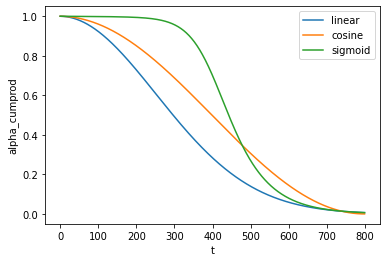

In [6]:
start = (beta_min*1000)/T
print(start)
end = (beta_max*1000)/T
print(end)

# Linear
betas_l = linear_beta_schedule(timesteps=T, start=start, end=end)
alphas_l = 1. - betas_l
alphas_cumprod_l = torch.cumprod(alphas_l, axis=0)
alphas_cumprod_prev_l = F.pad(alphas_cumprod_l[:-1], (1, 0), value=1.0)
sqrt_recip_alphas_l = torch.sqrt(1.0 / alphas_l)
sqrt_alphas_cumprod_l = torch.sqrt(alphas_cumprod_l)
sqrt_one_minus_alphas_cumprod_l = torch.sqrt(1. - alphas_cumprod_l)

# Cosine
betas_c = cosine_beta_schedule(timesteps=T, s=s)
alphas_c = 1. - betas_c
alphas_cumprod_c = torch.cumprod(alphas_c, axis=0)
alphas_cumprod_prev_c = F.pad(alphas_cumprod_c[:-1], (1, 0), value=1.0)
sqrt_recip_alphas_c = torch.sqrt(1.0 / alphas_c)
sqrt_alphas_cumprod_c = torch.sqrt(alphas_cumprod_c)
sqrt_one_minus_alphas_cumprod_c = torch.sqrt(1. - alphas_cumprod_c)

# Sigmoid
betas_s = sigmoid_beta_schedule(timesteps=T, start=start, end=end)
alphas_s = 1. - betas_s
alphas_cumprod_s = torch.cumprod(alphas_s, axis=0)
alphas_cumprod_prev_s = F.pad(alphas_cumprod_s[:-1], (1, 0), value=1.0)
sqrt_recip_alphas_s = torch.sqrt(1.0 / alphas_s)
sqrt_alphas_cumprod_s = torch.sqrt(alphas_cumprod_s)
sqrt_one_minus_alphas_cumprod_s = torch.sqrt(1. - alphas_cumprod_s)

# Plot
plt.plot(alphas_cumprod_l, label="linear")
plt.plot(alphas_cumprod_c, label="cosine")
plt.plot(alphas_cumprod_s, label="sigmoid")
plt.legend()
plt.xlabel("t")
plt.ylabel("alpha_cumprod")

print(alphas_cumprod_l[:5])
print(alphas_cumprod_c[:5])
print(alphas_cumprod_s[:5])

print(alphas_cumprod_l[-5:])
print(alphas_cumprod_c[-5:])
print(alphas_cumprod_s[-5:])

In [29]:
start = (beta_min*1000)/T
end = (beta_max*1000)/T
schedule = 'linear'
T = 100

if schedule == 'linear':
  function = linear_beta_schedule
  betas = function(timesteps=T, start=start, end=end)
if schedule == 'sigmoid':
  function = sigmoid_beta_schedule
  betas = function(timesteps=T, start=start, end=end)
if schedule == 'cosine':
  function = cosine_beta_schedule
  betas = function(timesteps=T, s=s)

alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)

alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

print(sqrt_one_minus_alphas_cumprod[0])
print(sqrt_one_minus_alphas_cumprod[-1])

tensor(0.0100)
tensor(0.9972)


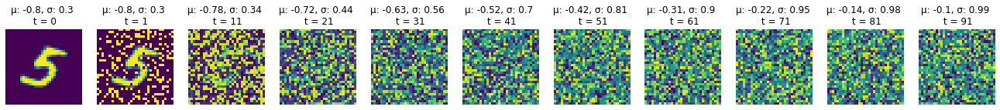

In [30]:
# Simulate forward diffusion
image = next(iter(dataloader))[0]
plt.figure(figsize=(25,15))
num_images = 10
bins = 20
stepsize = int(T/num_images)
flattens = []

(sigma, mu) = torch.var_mean(image)
flat = torch.flatten(image)
flattens.append(flat)
plt.subplot(1, num_images+2, 1)
title = 'μ: {}, σ: {} \n t = {}'.format(float(f'{mu.item():.2f}'), float(f'{sigma.item():.2f}'), 0)
plt.title(title)
show_tensor_image(image)
plt.axis('off')
for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+2, int(idx/stepsize) + 2)
    noised_image, noise = forward_diffusion_sample(image, t)
    (sigma, mu) = torch.var_mean(noised_image)
    flat = torch.flatten(noised_image)
    flattens.append(flat)
    title = 'μ: {}, σ: {} \n t = {}'.format(float(f'{mu.item():.2f}'), float(f'{sigma.item():.2f}'), idx+1)
    plt.title(title)
    show_tensor_image(noised_image)
    plt.axis('off')

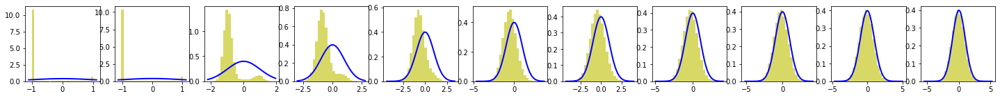

In [31]:
from scipy.stats import norm
plt.figure(figsize=(25,2))
for i, flat in enumerate(flattens):
  plt.subplot(1, num_images+1, i + 1)
  plt.hist(flat, bins=25, density=True, alpha=0.6, color='y')
  xmin, xmax = plt.xlim()
  x = np.linspace(xmin, xmax, 100)
  p = norm.pdf(x, 0, 1)
  plt.plot(x, p, 'b', linewidth=2)

## Define model Unet with attention

In [10]:
def exists(x):
    return x is not None

def default(val, d):
    if exists(val):
        return val
    return d() if isfunction(d) else d

class Residual(nn.Module):
    def __init__(self, fn):
        super().__init__()
        self.fn = fn

    def forward(self, x, *args, **kwargs):
        return self.fn(x, *args, **kwargs) + x

def Upsample(dim):
    return nn.ConvTranspose2d(dim, dim, 4, 2, 1)

def Downsample(dim):
    return nn.Conv2d(dim, dim, 4, 2, 1)

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

class Block(nn.Module):
    def __init__(self, dim, dim_out, groups = 8):
        super().__init__()
        self.proj = nn.Conv2d(dim, dim_out, 3, padding = 1)
        self.norm = nn.GroupNorm(groups, dim_out)
        self.act = nn.SiLU()

    def forward(self, x, scale_shift = None):
        x = self.proj(x)
        x = self.norm(x)

        if exists(scale_shift):
            scale, shift = scale_shift
            x = x * (scale + 1) + shift

        x = self.act(x)
        return x

class ResnetBlock(nn.Module):
    """https://arxiv.org/abs/1512.03385"""
    
    def __init__(self, dim, dim_out, *, time_emb_dim=None, groups=8):
        super().__init__()
        self.mlp = (
            nn.Sequential(nn.SiLU(), nn.Linear(time_emb_dim, dim_out))
            if exists(time_emb_dim)
            else None
        )

        self.block1 = Block(dim, dim_out, groups=groups)
        self.block2 = Block(dim_out, dim_out, groups=groups)
        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb=None):
        h = self.block1(x)

        if exists(self.mlp) and exists(time_emb):
            time_emb = self.mlp(time_emb)
            h = rearrange(time_emb, "b c -> b c 1 1") + h

        h = self.block2(h)
        return h + self.res_conv(x)
    
class ConvNextBlock(nn.Module):
    """https://arxiv.org/abs/2201.03545"""

    def __init__(self, dim, dim_out, *, time_emb_dim=None, mult=2, norm=True):
        super().__init__()
        self.mlp = (
            nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, dim))
            if exists(time_emb_dim)
            else None
        )

        self.ds_conv = nn.Conv2d(dim, dim, 7, padding=3, groups=dim)

        self.net = nn.Sequential(
            nn.GroupNorm(1, dim) if norm else nn.Identity(),
            nn.Conv2d(dim, dim_out * mult, 3, padding=1),
            nn.GELU(),
            nn.GroupNorm(1, dim_out * mult),
            nn.Conv2d(dim_out * mult, dim_out, 3, padding=1),
        )

        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb=None):
        h = self.ds_conv(x)

        if exists(self.mlp) and exists(time_emb):
            assert exists(time_emb), "time embedding must be passed in"
            condition = self.mlp(time_emb)
            h = h + rearrange(condition, "b c -> b c 1 1")

        h = self.net(h)
        return h + self.res_conv(x)

class Attention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)
        self.to_out = nn.Conv2d(hidden_dim, dim, 1)

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(lambda t: rearrange(t, "b (h c) x y -> b h c (x y)", h=self.heads), qkv)
        q = q * self.scale

        sim = einsum("b h d i, b h d j -> b h i j", q, k)
        sim = sim - sim.amax(dim=-1, keepdim=True).detach()
        attn = sim.softmax(dim=-1)

        out = einsum("b h i j, b h d j -> b h i d", attn, v)
        out = rearrange(out, "b h (x y) d -> b (h d) x y", x=h, y=w)
        return self.to_out(out)

class LinearAttention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)

        self.to_out = nn.Sequential(nn.Conv2d(hidden_dim, dim, 1), 
                                    nn.GroupNorm(1, dim))

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(
            lambda t: rearrange(t, "b (h c) x y -> b h c (x y)", h=self.heads), qkv
        )

        q = q.softmax(dim=-2)
        k = k.softmax(dim=-1)

        q = q * self.scale
        context = torch.einsum("b h d n, b h e n -> b h d e", k, v)

        out = torch.einsum("b h d e, b h d n -> b h e n", context, q)
        out = rearrange(out, "b h c (x y) -> b (h c) x y", h=self.heads, x=h, y=w)
        return self.to_out(out)

class PreNorm(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.fn = fn
        self.norm = nn.GroupNorm(1, dim)

    def forward(self, x):
        x = self.norm(x)
        return self.fn(x)

class Unet(nn.Module):
    def __init__(
        self,
        dim,
        init_dim=None,
        out_dim=None,
        dim_mults=(1, 2, 4, 8),
        channels=3,
        with_time_emb=True,
        resnet_block_groups=8,
        use_convnext=True,
        convnext_mult=2,
    ):
        super().__init__()

        # determine dimensions
        self.channels = channels

        init_dim = default(init_dim, dim // 3 * 2)
        self.init_conv = nn.Conv2d(channels, init_dim, 7, padding=3)

        dims = [init_dim, *map(lambda m: dim * m, dim_mults)]
        in_out = list(zip(dims[:-1], dims[1:]))
        
        if use_convnext:
            block_klass = partial(ConvNextBlock, mult=convnext_mult)
        else:
            block_klass = partial(ResnetBlock, groups=resnet_block_groups)

        # time embeddings
        if with_time_emb:
            time_dim = dim * 4
            self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(dim),
                nn.Linear(dim, time_dim),
                nn.GELU(),
                nn.Linear(time_dim, time_dim),
            )
        else:
            time_dim = None
            self.time_mlp = None

        # layers
        self.downs = nn.ModuleList([])
        self.ups = nn.ModuleList([])
        num_resolutions = len(in_out)

        for ind, (dim_in, dim_out) in enumerate(in_out):
            is_last = ind >= (num_resolutions - 1)

            self.downs.append(
                nn.ModuleList(
                    [
                        block_klass(dim_in, dim_out, time_emb_dim=time_dim),
                        block_klass(dim_out, dim_out, time_emb_dim=time_dim),
                        Residual(PreNorm(dim_out, LinearAttention(dim_out))),
                        Downsample(dim_out) if not is_last else nn.Identity(),
                    ]
                )
            )

        mid_dim = dims[-1]
        self.mid_block1 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)
        self.mid_attn = Residual(PreNorm(mid_dim, Attention(mid_dim)))
        self.mid_block2 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)

        for ind, (dim_in, dim_out) in enumerate(reversed(in_out[1:])):
            is_last = ind >= (num_resolutions - 1)

            self.ups.append(
                nn.ModuleList(
                    [
                        block_klass(dim_out * 2, dim_in, time_emb_dim=time_dim),
                        block_klass(dim_in, dim_in, time_emb_dim=time_dim),
                        Residual(PreNorm(dim_in, LinearAttention(dim_in))),
                        Upsample(dim_in) if not is_last else nn.Identity(),
                    ]
                )
            )

        out_dim = default(out_dim, channels)
        self.final_conv = nn.Sequential(
            block_klass(dim, dim), nn.Conv2d(dim, out_dim, 1)
        )

    def forward(self, x, time):
        x = self.init_conv(x)

        t = self.time_mlp(time) if exists(self.time_mlp) else None

        h = []

        # downsample
        for block1, block2, attn, downsample in self.downs:
            x = block1(x, t)
            x = block2(x, t)
            x = attn(x)
            h.append(x)
            x = downsample(x)

        # bottleneck
        x = self.mid_block1(x, t)
        x = self.mid_attn(x)
        x = self.mid_block2(x, t)

        # upsample
        for block1, block2, attn, upsample in self.ups:
            x = torch.cat((x, h.pop()), dim=1)
            x = block1(x, t)
            x = block2(x, t)
            x = attn(x)
            x = upsample(x)

        return self.final_conv(x)
  
def load_model(model, model_name):
    state = torch.load(os.path.join('models', model_name), map_location=device)
    model.load_state_dict(state)
    return model

## Define Loss function

In [11]:
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.mse_loss(noise, noise_pred)

## Sample

In [12]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns 
    the denoised image. 
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x.shape)
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    
    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t)
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
    
    if t == 0:
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 1, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(num_images - i/stepsize))
            plt.title('t = {}'.format(i))
            #img2 = torch.clamp(img, 0, 1) # NEW
            show_tensor_image(img.detach().cpu())
    plt.show()            

## Train

In [13]:
model_name = 'model_attention_{}_{}.pth'.format(str(schedule), str(T))
device = "cuda" if torch.cuda.is_available() else "cpu"
model = Unet(dim=16, channels=1, dim_mults=(1, 2, 4, 8))
# model = load_model(model)
model.to(device)
print("Num params: ", sum(p.numel() for p in model.parameters()))
model
print(model_name)

Num params:  3841879
model_attention_cosine_800.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.1257641315460205 


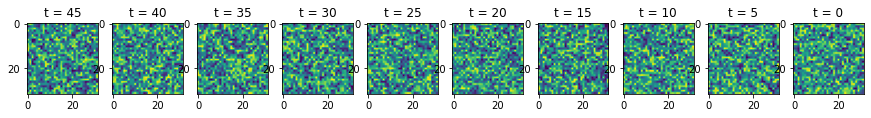

Epoch 0 | step 100 Loss: 0.24163994193077087 


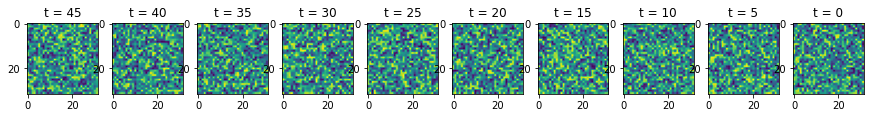

Epoch 0 | step 200 Loss: 0.08574872463941574 


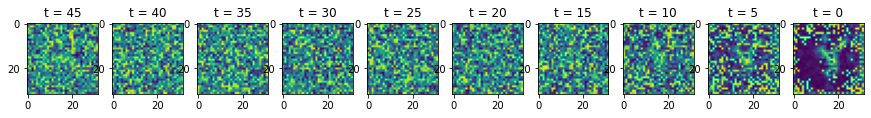

Epoch 0 | step 300 Loss: 0.07591596990823746 


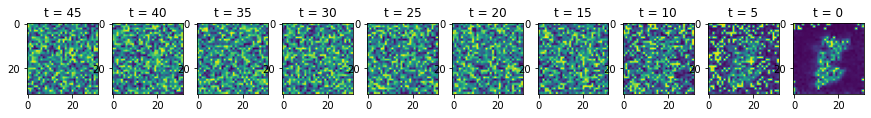

Epoch 0 | step 400 Loss: 0.06401167809963226 


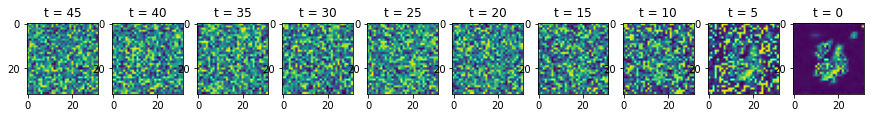

Epoch 0 | step 500 Loss: 0.06287600845098495 


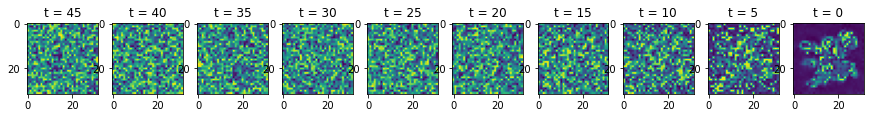

Epoch 1 | step 000 Loss: 0.051973000168800354 


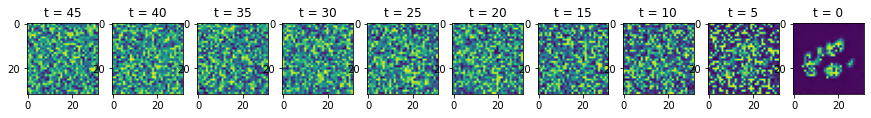

Epoch 1 | step 100 Loss: 0.044637180864810944 


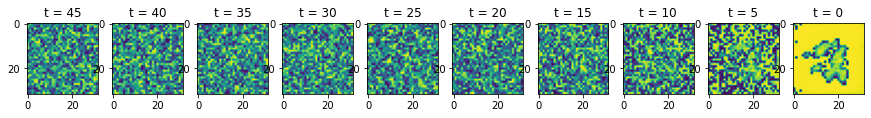

Epoch 1 | step 200 Loss: 0.04919921234250069 


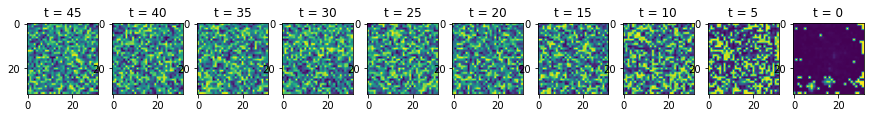

Epoch 1 | step 300 Loss: 0.03879993408918381 


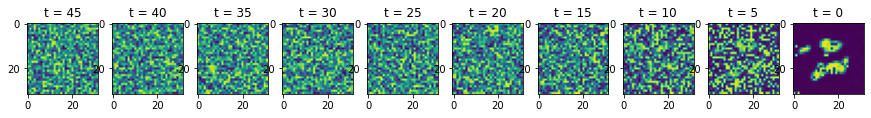

Epoch 1 | step 400 Loss: 0.04563269019126892 


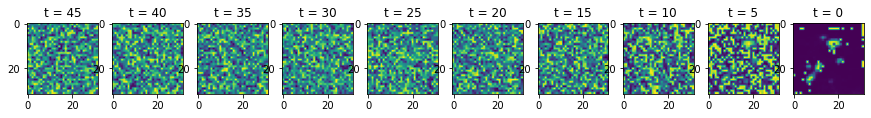

Epoch 1 | step 500 Loss: 0.05157008767127991 


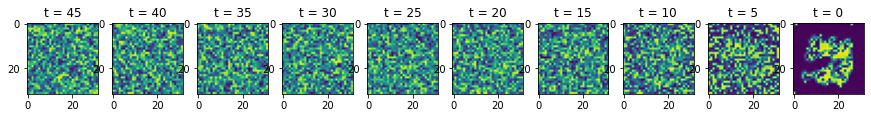

Epoch 2 | step 000 Loss: 0.04544306918978691 


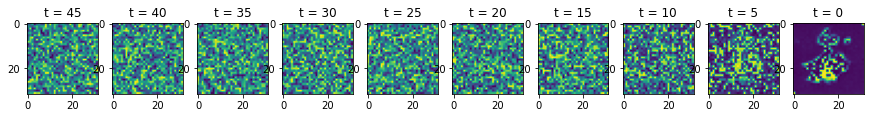

KeyboardInterrupt: ignored

In [152]:
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 5 # Try more!
PATH = 'models/' + model_name

for epoch in tqdm(range(epochs)):
    for step, batch in enumerate(dataloader):
      optimizer.zero_grad()

      t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
      loss = get_loss(model, batch[0], t)
      loss.backward()
      optimizer.step()

      if epoch % 1 == 0 and step % 100 == 0:
        print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
        sample_plot_image()
        #torch.save(model.state_dict(), PATH)

## Iteration to learn all the models

------ START TRAINING: model_attention_linear_50.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.2367408275604248 


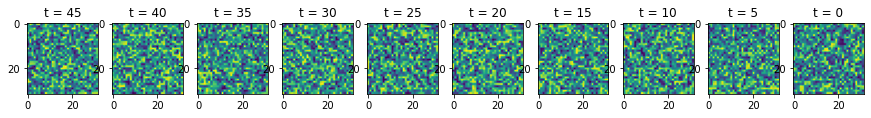

Epoch 0 | step 500 Loss: 0.06032858043909073 


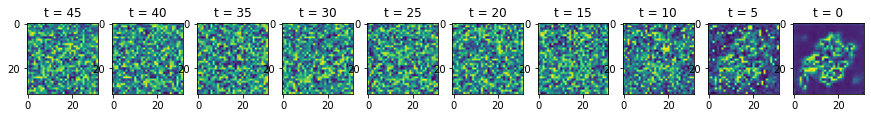

Epoch 1 | step 500 Loss: 0.04363419860601425 


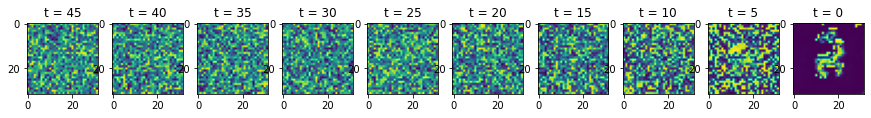

Epoch 2 | step 500 Loss: 0.036370787769556046 


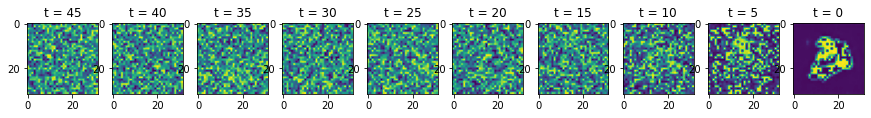

Epoch 3 | step 500 Loss: 0.03289904072880745 


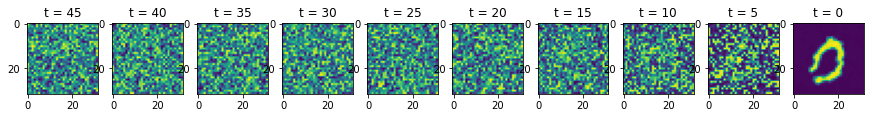

Epoch 4 | step 500 Loss: 0.03389753773808479 


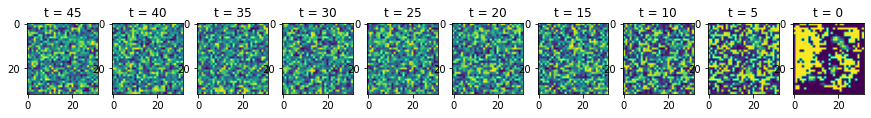

------ START TRAINING: model_attention_linear_100.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.179279088973999 


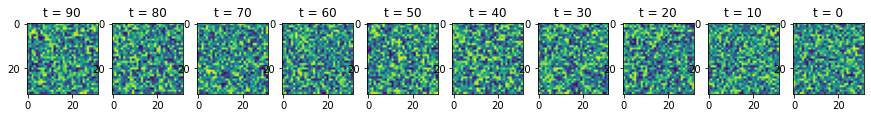

Epoch 0 | step 500 Loss: 0.047496505081653595 


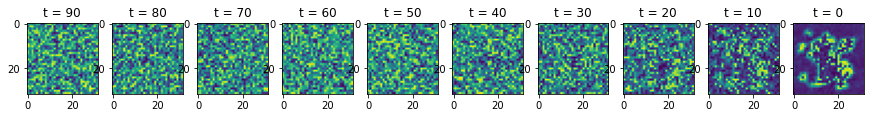

Epoch 1 | step 500 Loss: 0.045225851237773895 


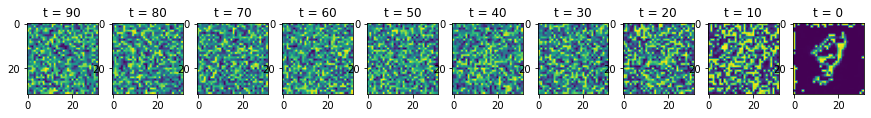

Epoch 2 | step 500 Loss: 0.04454142972826958 


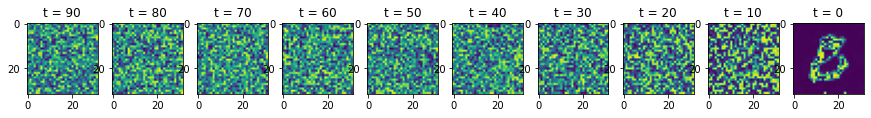

Epoch 3 | step 500 Loss: 0.03710026293992996 


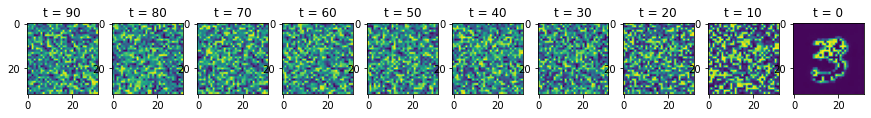

Epoch 4 | step 500 Loss: 0.03177906572818756 


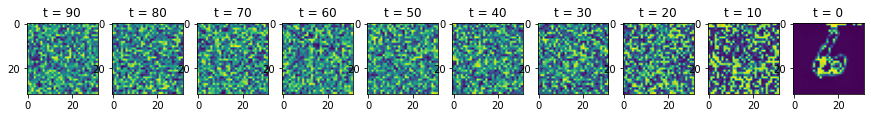

------ START TRAINING: model_attention_linear_200.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.3341023921966553 


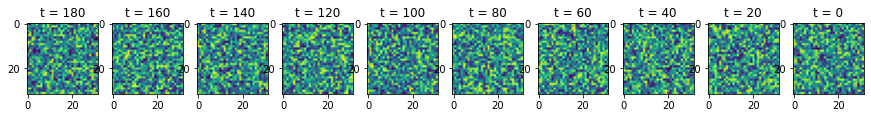

Epoch 0 | step 500 Loss: 0.058224037289619446 


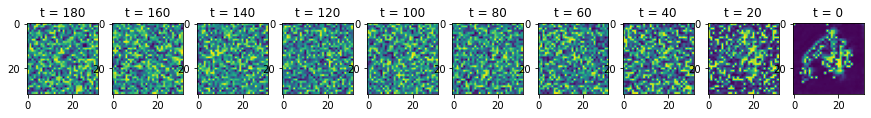

Epoch 1 | step 500 Loss: 0.04083527624607086 


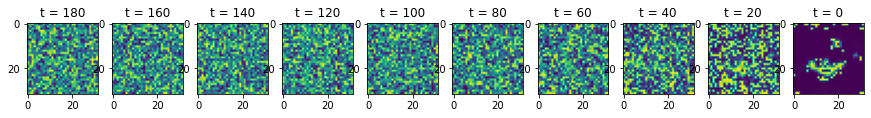

Epoch 2 | step 500 Loss: 0.05259842053055763 


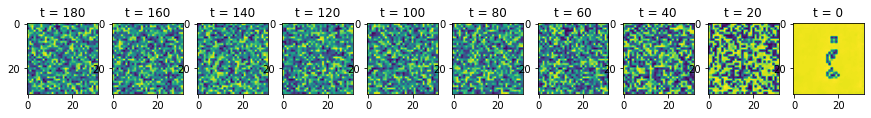

Epoch 3 | step 500 Loss: 0.03585486486554146 


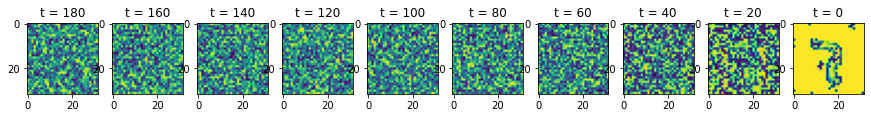

Epoch 4 | step 500 Loss: 0.03411869704723358 


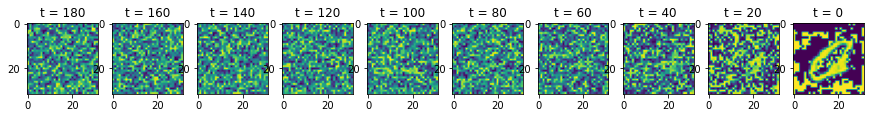

------ START TRAINING: model_attention_linear_400.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.1716022491455078 


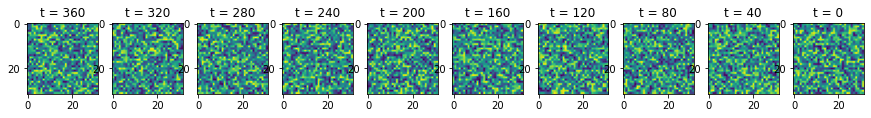

Epoch 0 | step 500 Loss: 0.054947927594184875 


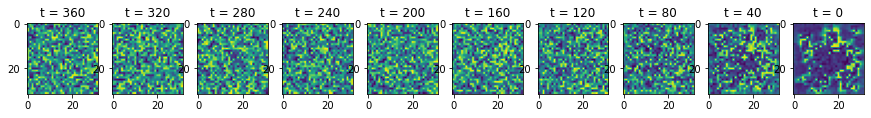

Epoch 1 | step 500 Loss: 0.03900492191314697 


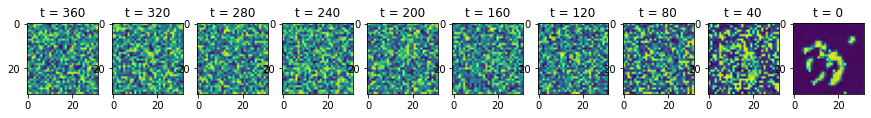

Epoch 2 | step 500 Loss: 0.034138843417167664 


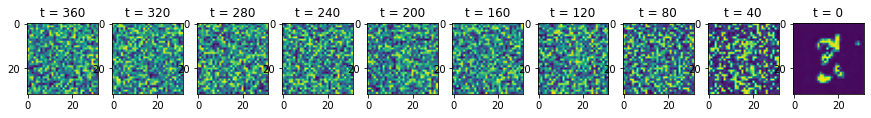

Epoch 3 | step 500 Loss: 0.03855534642934799 


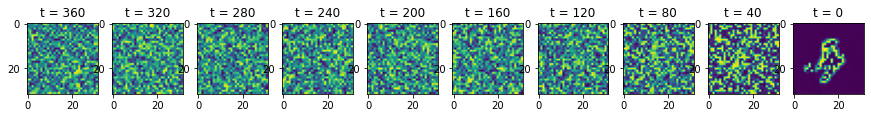

Epoch 4 | step 500 Loss: 0.031423747539520264 


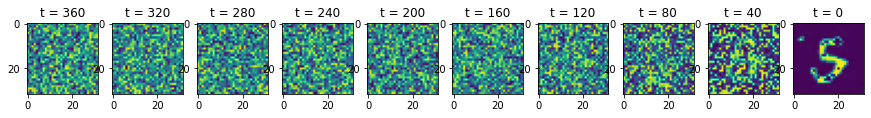

------ START TRAINING: model_attention_linear_800.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.1086369752883911 


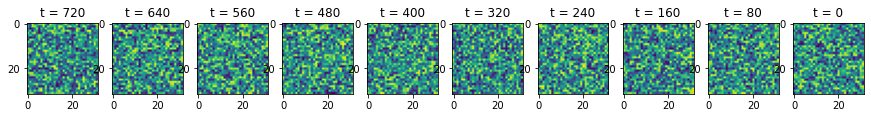

Epoch 0 | step 500 Loss: 0.06853697448968887 


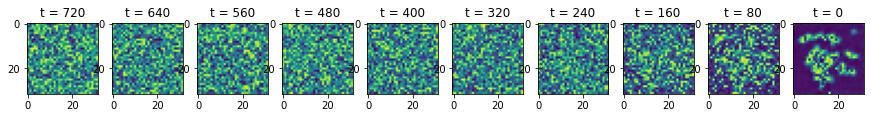

Epoch 1 | step 500 Loss: 0.040601663291454315 


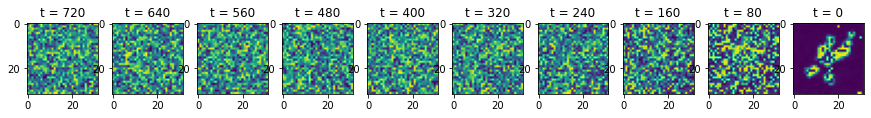

Epoch 2 | step 500 Loss: 0.035050004720687866 


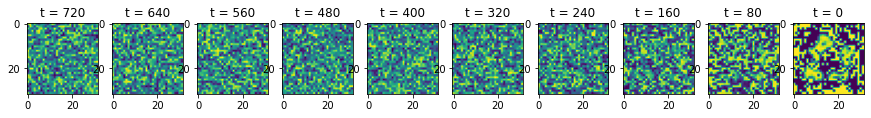

Epoch 3 | step 500 Loss: 0.032188862562179565 


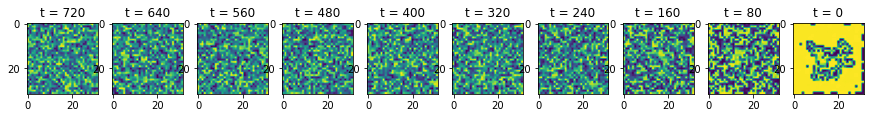

Epoch 4 | step 500 Loss: 0.035350680351257324 


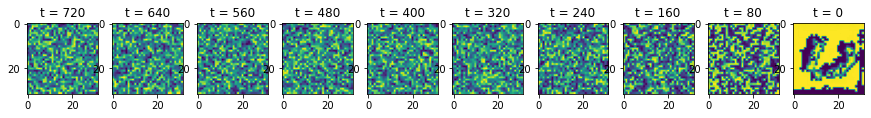

In [159]:
schedules = ['linear'] #, 'sigmoid', 'cosine']
Ts = [50, 100, 200, 400, 800]
loss_d = dict.fromkeys(schedules)
for schedule in loss_d:
  loss_d[schedule] = dict.fromkeys(Ts)
  for T in loss_d[schedule]:
    loss_d[schedule][T] = []
device = "cuda" if torch.cuda.is_available() else "cpu"
epochs = 5 # Try more!

for schedule in schedules:
  for T in Ts:

    # Define schedules
    start = (beta_min*1000)/T
    end = (beta_max*1000)/T
    if schedule == 'linear':
      function = linear_beta_schedule
      betas = function(timesteps=T, start=start, end=end)
    if schedule == 'sigmoid':
      function = sigmoid_beta_schedule
      betas = function(timesteps=T, start=start, end=end)
    if schedule == 'cosine':
      function = cosine_beta_schedule
      betas = function(timesteps=T, s=s)

    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
    sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

    # Define model
    model_name = 'model_attention_{}_{}.pth'.format(str(schedule), str(T))
    model = Unet(dim=16, channels=1, dim_mults=(1, 2, 4, 8))
    model.to(device)
    optimizer = Adam(model.parameters(), lr=0.001)
    PATH = 'models/' + model_name
    print('------ START TRAINING:', model_name)

    # Start training
    for epoch in tqdm(range(epochs)):
      for step, batch in enumerate(dataloader):
        optimizer.zero_grad()

        t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
        loss = get_loss(model, batch[0], t)
        loss.backward()
        optimizer.step()
        if epoch == 0 and step == 0:
          print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
          sample_plot_image()
          loss_d[schedule][T].append(loss.item())
        if epoch % 1 == 0 and step == 500:
          print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
          sample_plot_image()
          loss_d[schedule][T].append(loss.item())
          torch.save(model.state_dict(), PATH)

In [161]:
import json
with open('losses_{}.txt'.format(schedule), 'w') as convert_file:
  convert_file.write(json.dumps(loss_d))
loss_d

{'linear': {50: [1.2367408275604248,
   0.06032858043909073,
   0.04363419860601425,
   0.036370787769556046,
   0.03289904072880745,
   0.03389753773808479],
  100: [1.179279088973999,
   0.047496505081653595,
   0.045225851237773895,
   0.04454142972826958,
   0.03710026293992996,
   0.03177906572818756],
  200: [1.3341023921966553,
   0.058224037289619446,
   0.04083527624607086,
   0.05259842053055763,
   0.03585486486554146,
   0.03411869704723358],
  400: [1.1716022491455078,
   0.054947927594184875,
   0.03900492191314697,
   0.034138843417167664,
   0.03855534642934799,
   0.031423747539520264],
  800: [1.1086369752883911,
   0.06853697448968887,
   0.040601663291454315,
   0.035050004720687866,
   0.032188862562179565,
   0.035350680351257324]}}

------ START TRAINING: model_attention_sigmoid_50.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.4297716617584229 


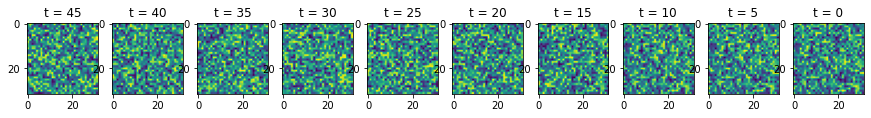

Epoch 0 | step 500 Loss: 0.08783827722072601 


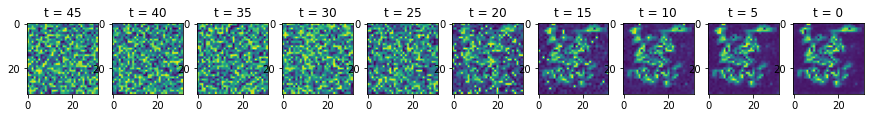

Epoch 1 | step 500 Loss: 0.06520616263151169 


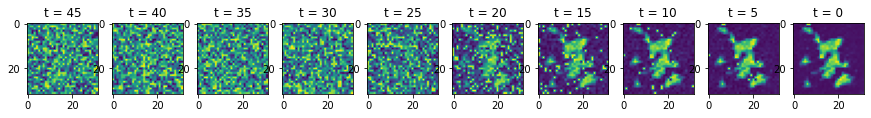

Epoch 2 | step 500 Loss: 0.06102972477674484 


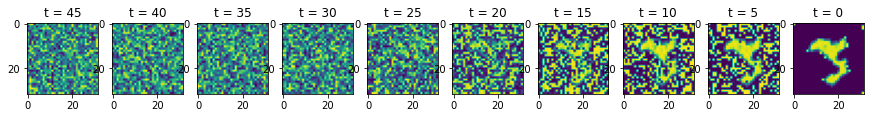

Epoch 3 | step 500 Loss: 0.05678729712963104 


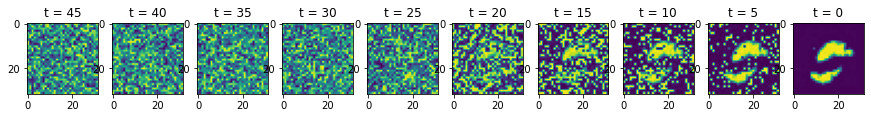

Epoch 4 | step 500 Loss: 0.050060056149959564 


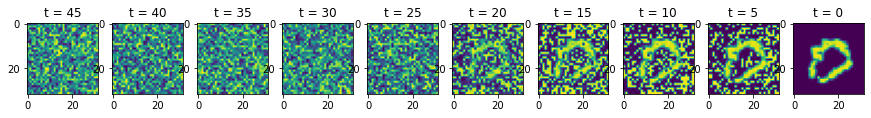

------ START TRAINING: model_attention_sigmoid_100.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.2663536071777344 


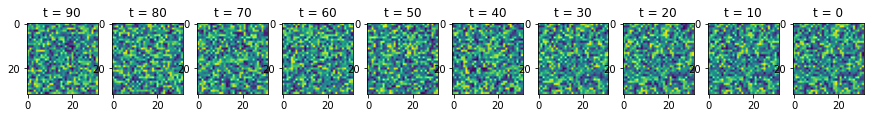

Epoch 0 | step 500 Loss: 0.10409678518772125 


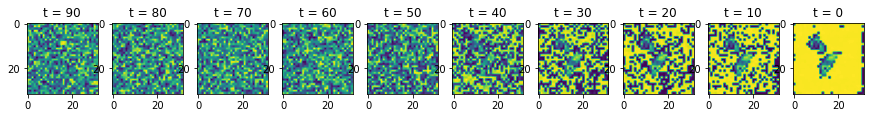

Epoch 1 | step 500 Loss: 0.0794469490647316 


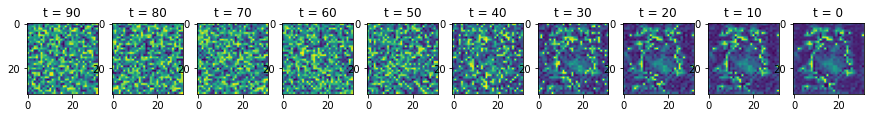

Epoch 2 | step 500 Loss: 0.058231111615896225 


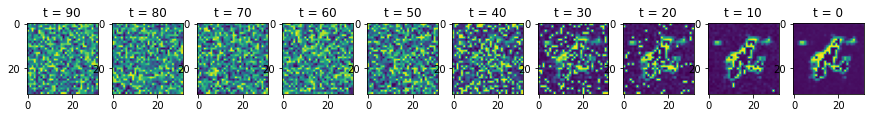

Epoch 3 | step 500 Loss: 0.04920712858438492 


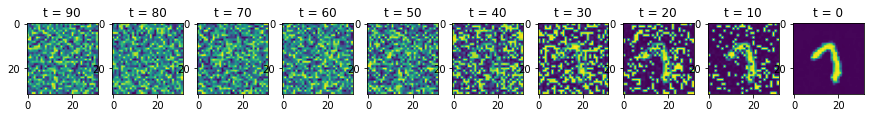

Epoch 4 | step 500 Loss: 0.05409400910139084 


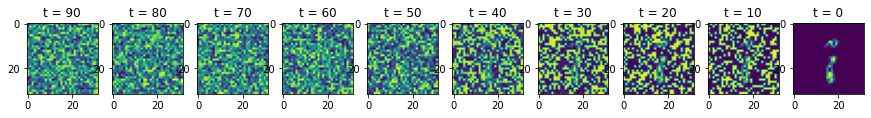

------ START TRAINING: model_attention_sigmoid_200.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.2729873657226562 


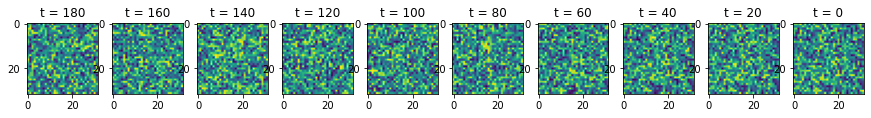

Epoch 0 | step 500 Loss: 0.13040781021118164 


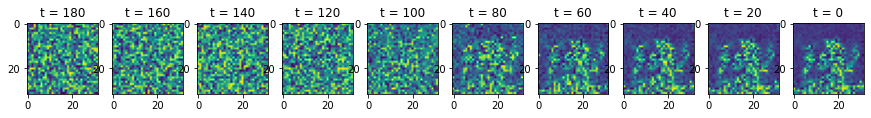

Epoch 1 | step 500 Loss: 0.09110157191753387 


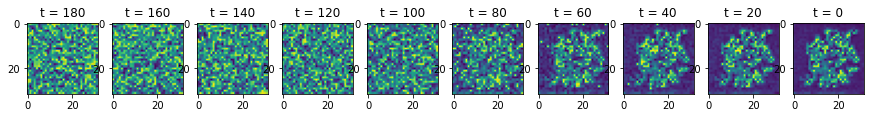

Epoch 2 | step 500 Loss: 0.06443651765584946 


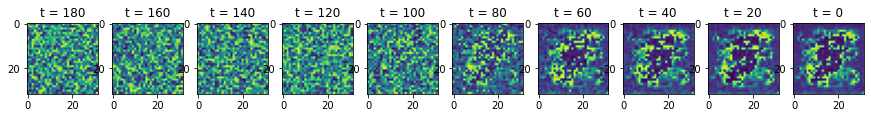

Epoch 3 | step 500 Loss: 0.057331159710884094 


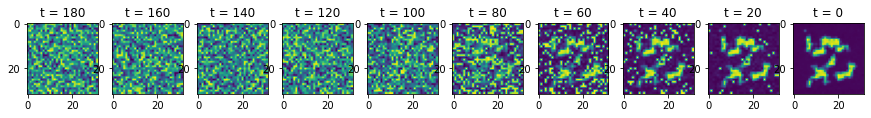

Epoch 4 | step 500 Loss: 0.06338338553905487 


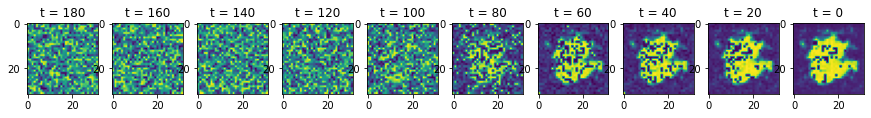

------ START TRAINING: model_attention_sigmoid_400.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.1435579061508179 


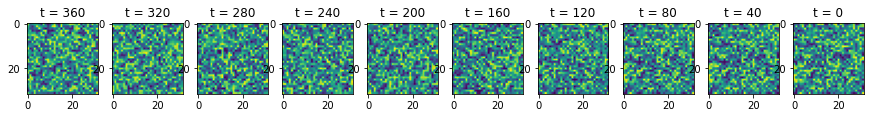

Epoch 0 | step 500 Loss: 0.09568416327238083 


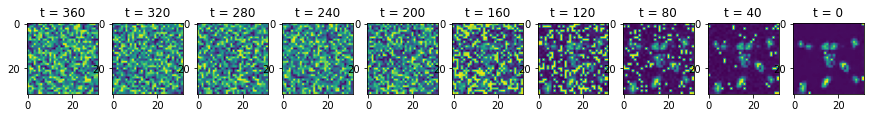

Epoch 1 | step 500 Loss: 0.07702067494392395 


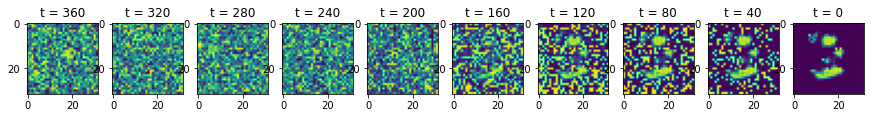

Epoch 2 | step 500 Loss: 0.062269434332847595 


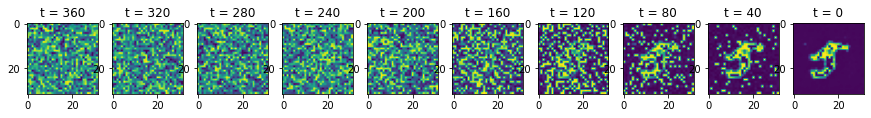

Epoch 3 | step 500 Loss: 0.07085157185792923 


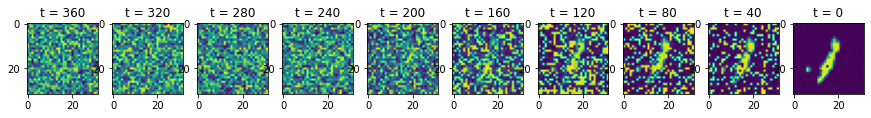

Epoch 4 | step 500 Loss: 0.06919778138399124 


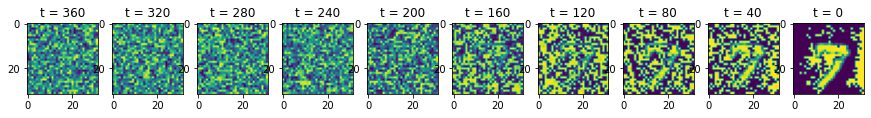

------ START TRAINING: model_attention_sigmoid_800.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.1324326992034912 


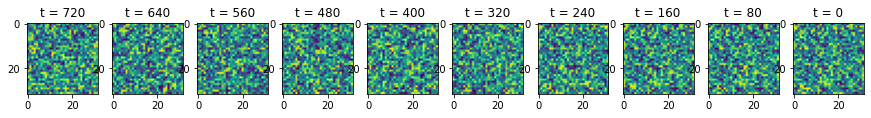

Epoch 0 | step 500 Loss: 0.09511275589466095 


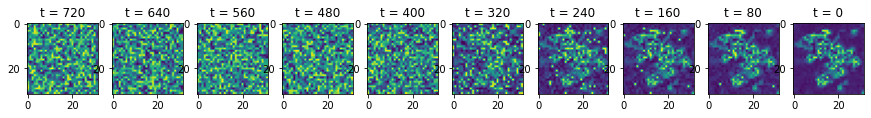

Epoch 1 | step 500 Loss: 0.07633516192436218 


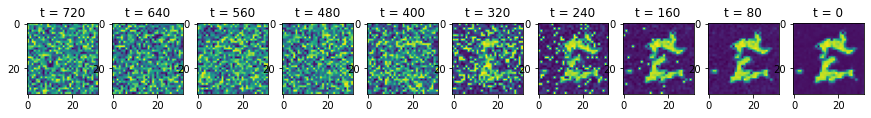

Epoch 2 | step 500 Loss: 0.061369773000478745 


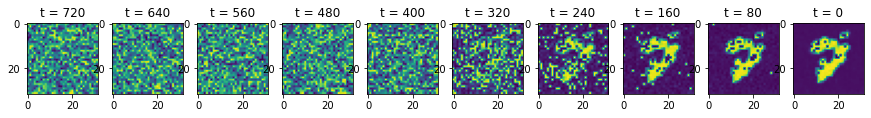

Epoch 3 | step 500 Loss: 0.05374303087592125 


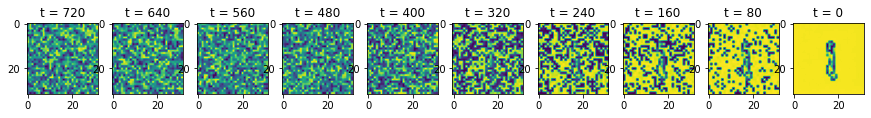

Epoch 4 | step 500 Loss: 0.05226811766624451 


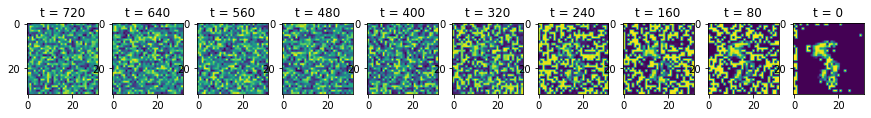

In [162]:
schedules = ['sigmoid']
Ts = [50, 100, 200, 400, 800]
loss_d2 = dict.fromkeys(schedules)
for schedule in loss_d2:
  loss_d2[schedule] = dict.fromkeys(Ts)
  for T in loss_d2[schedule]:
    loss_d2[schedule][T] = []
device = "cuda" if torch.cuda.is_available() else "cpu"
epochs = 5 # Try more!

for schedule in schedules:
  for T in Ts:

    # Define schedules
    start = (beta_min*1000)/T
    end = (beta_max*1000)/T
    if schedule == 'linear':
      function = linear_beta_schedule
      betas = function(timesteps=T, start=start, end=end)
    if schedule == 'sigmoid':
      function = sigmoid_beta_schedule
      betas = function(timesteps=T, start=start, end=end)
    if schedule == 'cosine':
      function = cosine_beta_schedule
      betas = function(timesteps=T, s=s)

    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
    sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

    # Define model
    model_name = 'model_attention_{}_{}.pth'.format(str(schedule), str(T))
    model = Unet(dim=16, channels=1, dim_mults=(1, 2, 4, 8))
    model.to(device)
    optimizer = Adam(model.parameters(), lr=0.001)
    PATH = 'models/' + model_name
    print('------ START TRAINING:', model_name)

    # Start training
    for epoch in tqdm(range(epochs)):
      for step, batch in enumerate(dataloader):
        optimizer.zero_grad()

        t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
        loss = get_loss(model, batch[0], t)
        loss.backward()
        optimizer.step()
        if epoch == 0 and step == 0:
          print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
          sample_plot_image()
          loss_d2[schedule][T].append(loss.item())
        if epoch % 1 == 0 and step == 500:
          print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
          sample_plot_image()
          loss_d2[schedule][T].append(loss.item())
          torch.save(model.state_dict(), PATH)

In [163]:
with open('losses_{}.txt'.format(schedule), 'w') as convert_file:
  convert_file.write(json.dumps(loss_d2))
loss_d2

{'sigmoid': {50: [1.4297716617584229,
   0.08783827722072601,
   0.06520616263151169,
   0.06102972477674484,
   0.05678729712963104,
   0.050060056149959564],
  100: [1.2663536071777344,
   0.10409678518772125,
   0.0794469490647316,
   0.058231111615896225,
   0.04920712858438492,
   0.05409400910139084],
  200: [1.2729873657226562,
   0.13040781021118164,
   0.09110157191753387,
   0.06443651765584946,
   0.057331159710884094,
   0.06338338553905487],
  400: [1.1435579061508179,
   0.09568416327238083,
   0.07702067494392395,
   0.062269434332847595,
   0.07085157185792923,
   0.06919778138399124],
  800: [1.1324326992034912,
   0.09511275589466095,
   0.07633516192436218,
   0.061369773000478745,
   0.05374303087592125,
   0.05226811766624451]}}

------ START TRAINING: model_attention_cosine_50.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.2189915180206299 


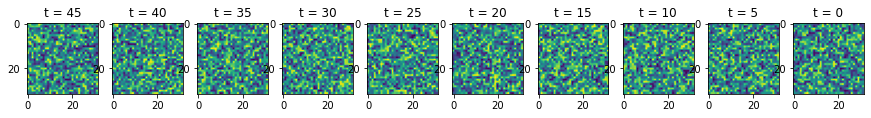

Epoch 0 | step 500 Loss: 0.05825793370604515 


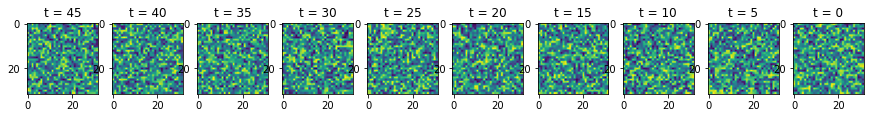

Epoch 1 | step 500 Loss: 0.04167633503675461 


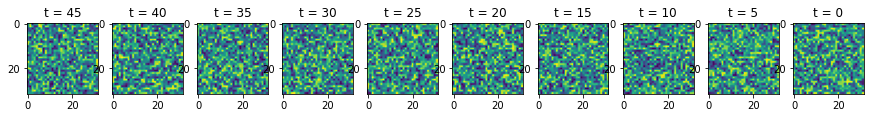

Epoch 2 | step 500 Loss: 0.046263642609119415 


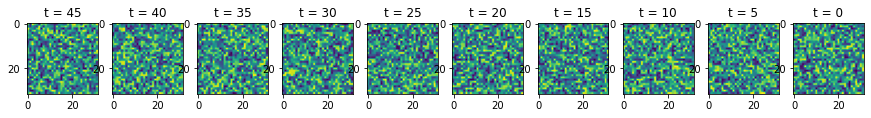

Epoch 3 | step 500 Loss: 0.03300534188747406 


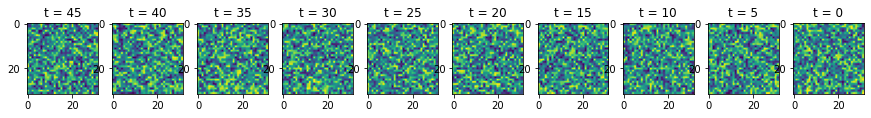

Epoch 4 | step 500 Loss: 0.03864859789609909 


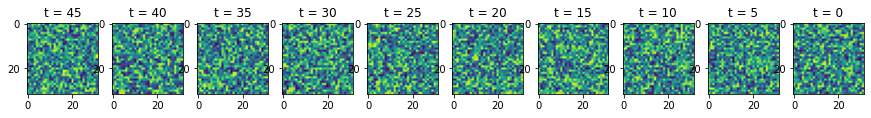

------ START TRAINING: model_attention_cosine_100.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.3311834335327148 


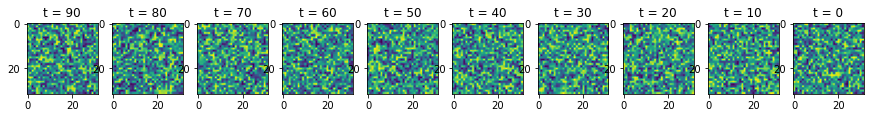

Epoch 0 | step 500 Loss: 0.07208463549613953 


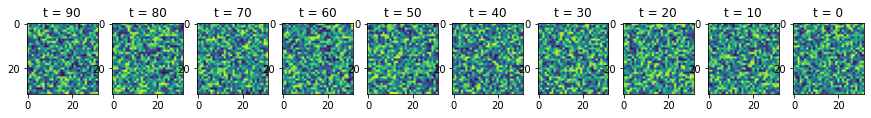

Epoch 1 | step 500 Loss: 0.04801636189222336 


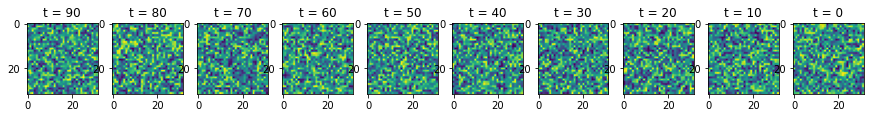

Epoch 2 | step 500 Loss: 0.0421469509601593 


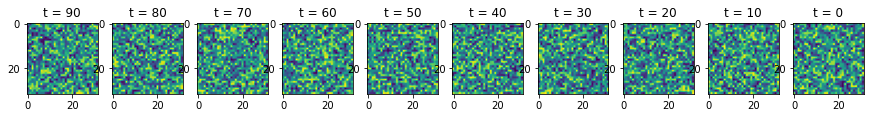

Epoch 3 | step 500 Loss: 0.04044164717197418 


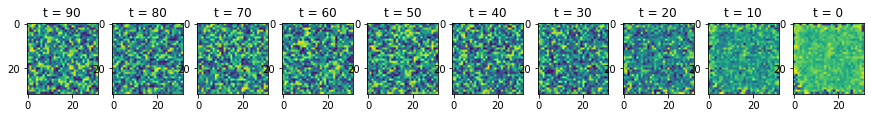

Epoch 4 | step 500 Loss: 0.03365154564380646 


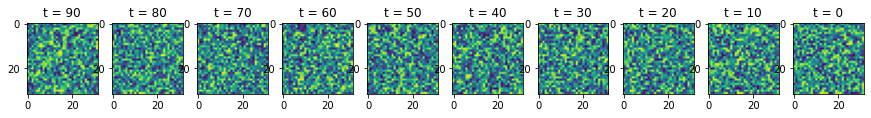

------ START TRAINING: model_attention_cosine_200.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.1643013954162598 


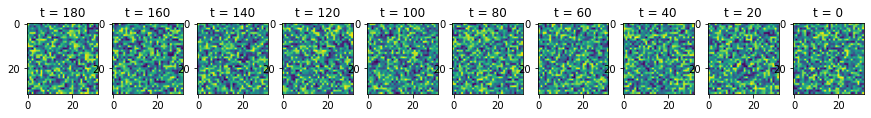

Epoch 0 | step 500 Loss: 0.052155714482069016 


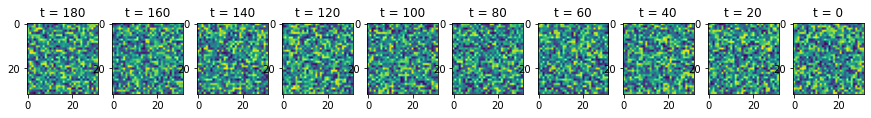

Epoch 1 | step 500 Loss: 0.04883092641830444 


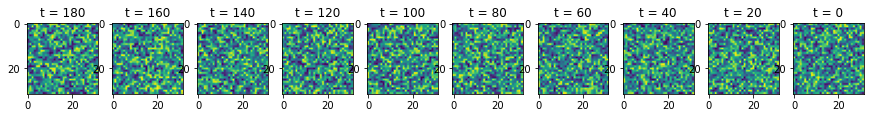

Epoch 2 | step 500 Loss: 0.044041503220796585 


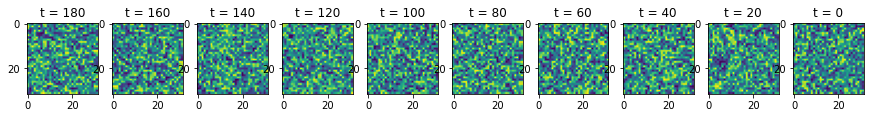

Epoch 3 | step 500 Loss: 0.03952101618051529 


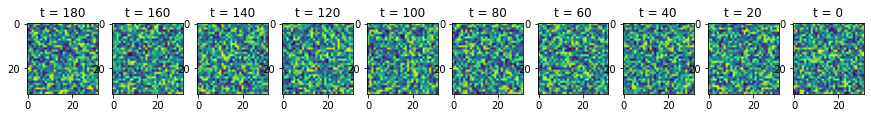

Epoch 4 | step 500 Loss: 0.04508557915687561 


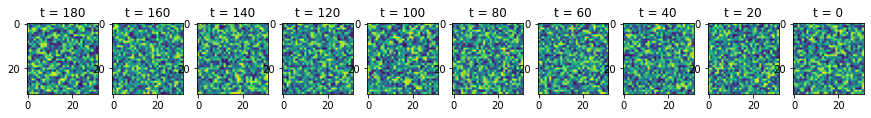

------ START TRAINING: model_attention_cosine_400.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.095703125 


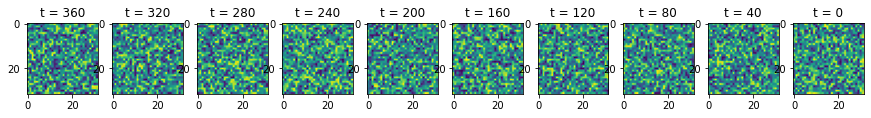

Epoch 0 | step 500 Loss: 0.05545927584171295 


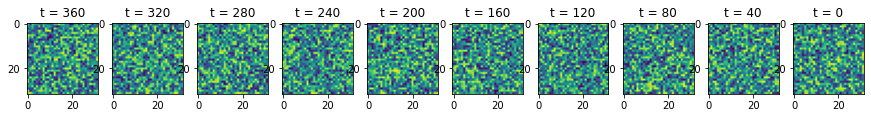

Epoch 1 | step 500 Loss: 0.04294992983341217 


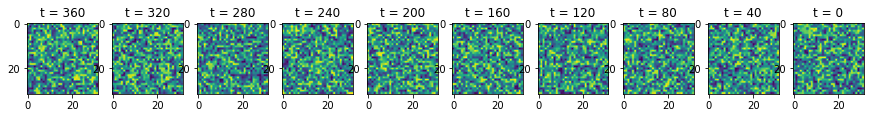

Epoch 2 | step 500 Loss: 0.046372316777706146 


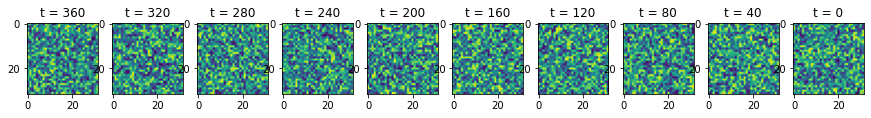

Epoch 3 | step 500 Loss: 0.03984348103404045 


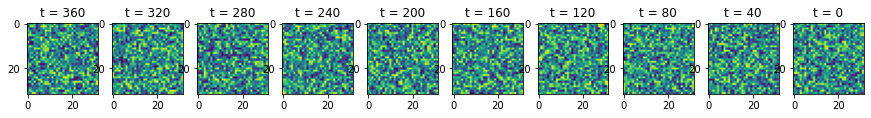

Epoch 4 | step 500 Loss: 0.03781367838382721 


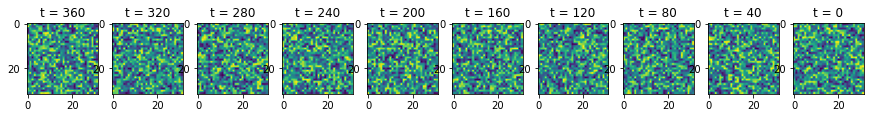

------ START TRAINING: model_attention_cosine_800.pth


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 0 | step 000 Loss: 1.2056446075439453 


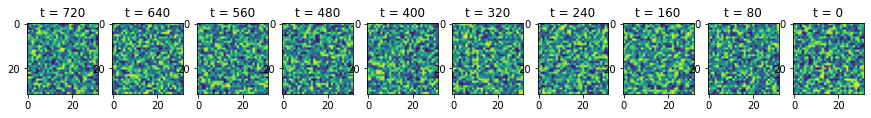

Epoch 0 | step 500 Loss: 0.057258039712905884 


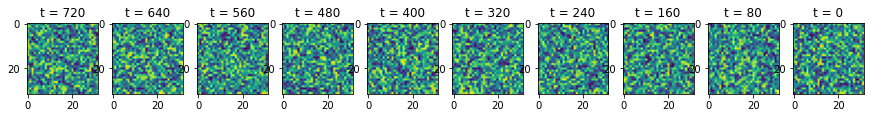

Epoch 1 | step 500 Loss: 0.05647394433617592 


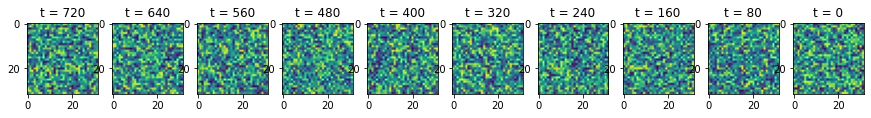

Epoch 2 | step 500 Loss: 0.042612917721271515 


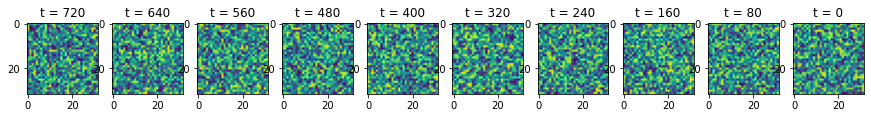

Epoch 3 | step 500 Loss: 0.04050317034125328 


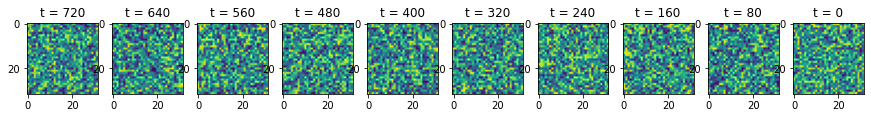

Epoch 4 | step 500 Loss: 0.04278445616364479 


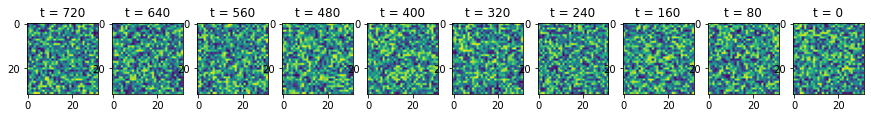

In [164]:
schedules = ['cosine']
Ts = [50, 100, 200, 400, 800]
loss_d3 = dict.fromkeys(schedules)
for schedule in loss_d3:
  loss_d3[schedule] = dict.fromkeys(Ts)
  for T in loss_d3[schedule]:
    loss_d3[schedule][T] = []
device = "cuda" if torch.cuda.is_available() else "cpu"
epochs = 5 # Try more!

for schedule in schedules:
  for T in Ts:

    # Define schedules
    start = (beta_min*1000)/T
    end = (beta_max*1000)/T
    if schedule == 'linear':
      function = linear_beta_schedule
      betas = function(timesteps=T, start=start, end=end)
    if schedule == 'sigmoid':
      function = sigmoid_beta_schedule
      betas = function(timesteps=T, start=start, end=end)
    if schedule == 'cosine':
      function = cosine_beta_schedule
      betas = function(timesteps=T, s=s)

    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
    sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

    # Define model
    model_name = 'model_attention_{}_{}.pth'.format(str(schedule), str(T))
    model = Unet(dim=16, channels=1, dim_mults=(1, 2, 4, 8))
    model.to(device)
    optimizer = Adam(model.parameters(), lr=0.001)
    PATH = 'models/' + model_name
    print('------ START TRAINING:', model_name)

    # Start training
    for epoch in tqdm(range(epochs)):
      for step, batch in enumerate(dataloader):
        optimizer.zero_grad()

        t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
        loss = get_loss(model, batch[0], t)
        loss.backward()
        optimizer.step()
        if epoch == 0 and step == 0:
          print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
          sample_plot_image()
          loss_d3[schedule][T].append(loss.item())
        if epoch % 1 == 0 and step == 500:
          print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
          sample_plot_image()
          loss_d3[schedule][T].append(loss.item())
          torch.save(model.state_dict(), PATH)

In [165]:
with open('losses_{}.txt'.format(schedule), 'w') as convert_file:
  convert_file.write(json.dumps(loss_d3))
loss_d3

{'cosine': {50: [1.2189915180206299,
   0.05825793370604515,
   0.04167633503675461,
   0.046263642609119415,
   0.03300534188747406,
   0.03864859789609909],
  100: [1.3311834335327148,
   0.07208463549613953,
   0.04801636189222336,
   0.0421469509601593,
   0.04044164717197418,
   0.03365154564380646],
  200: [1.1643013954162598,
   0.052155714482069016,
   0.04883092641830444,
   0.044041503220796585,
   0.03952101618051529,
   0.04508557915687561],
  400: [1.095703125,
   0.05545927584171295,
   0.04294992983341217,
   0.046372316777706146,
   0.03984348103404045,
   0.03781367838382721],
  800: [1.2056446075439453,
   0.057258039712905884,
   0.05647394433617592,
   0.042612917721271515,
   0.04050317034125328,
   0.04278445616364479]}}

Text(0, 0.5, 'loss')

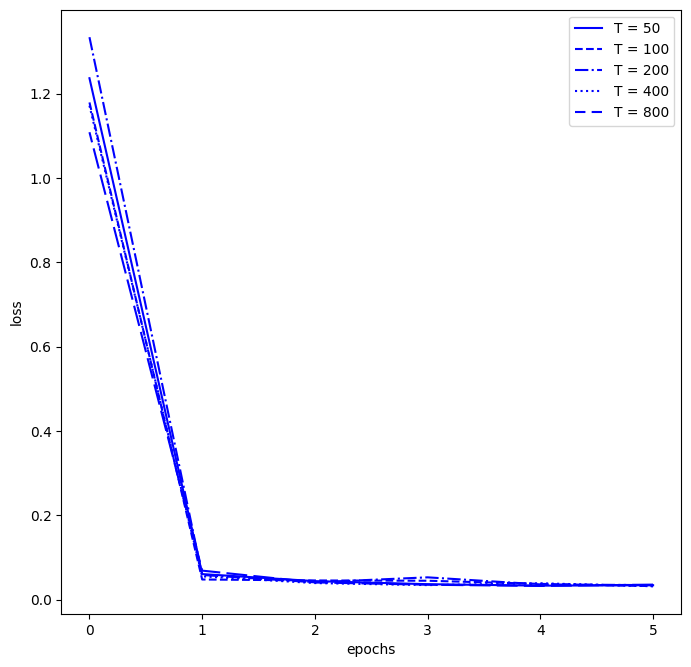

In [209]:
figure(figsize=(8, 8), dpi=100)
color = 'blue'
linestyles = ['-', '--', '-.', ':', (5, (10, 3))]
labels = ['T = 50', 'T = 100', 'T = 200', 'T = 400', 'T = 800']
for i, v in enumerate(loss_d['linear'].values()):
  plt.plot(v, label=labels[i], color=color, linestyle=linestyles[i])
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")

Text(0, 0.5, 'loss')

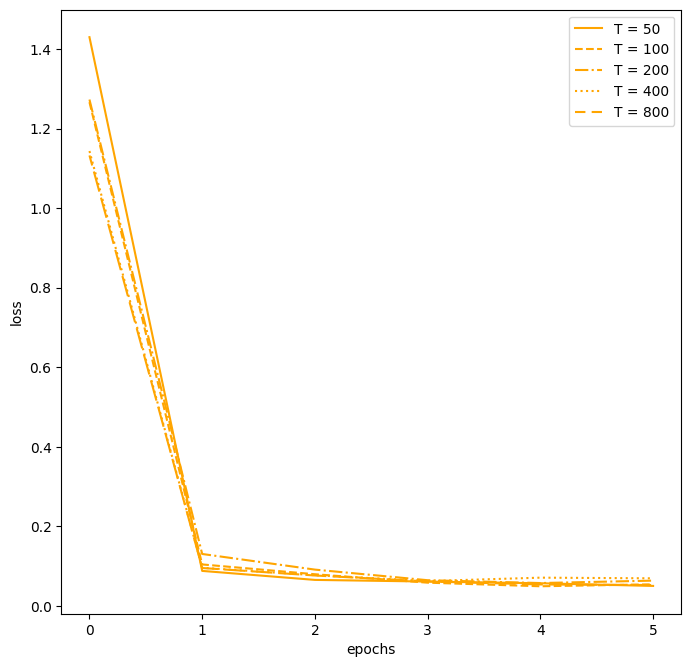

In [208]:
figure(figsize=(8, 8), dpi=100)
color = 'orange'
linestyles = ['-', '--', '-.', ':', (5, (10, 3))]
for i, v in enumerate(loss_d2['sigmoid'].values()):
  plt.plot(v, label=labels[i], color=color, linestyle=linestyles[i])
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")

Text(0, 0.5, 'loss')

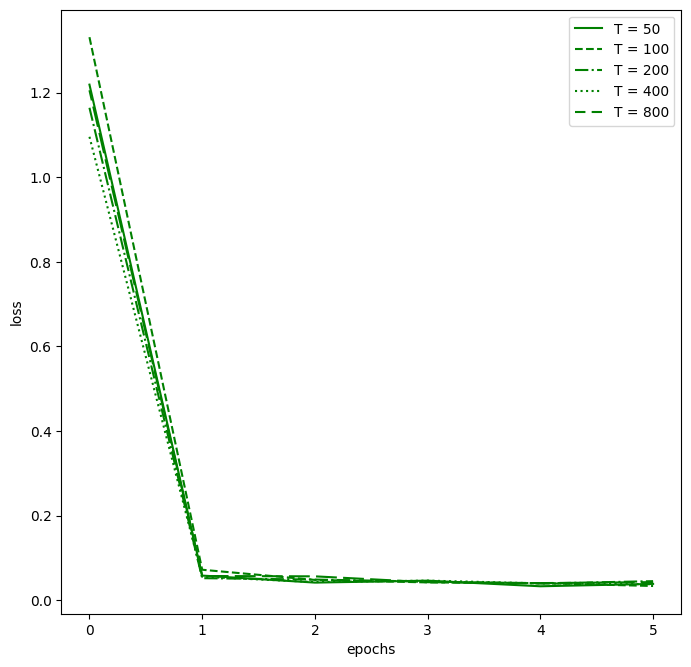

In [206]:
figure(figsize=(8, 8), dpi=100)
color = 'green'
linestyles = ['-', '--', '-.', ':', (5, (10, 3))]
for i, v in enumerate(loss_d3['cosine'].values()):
  plt.plot(v, label=labels[i], color=color, linestyle=linestyles[i])
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")

In [198]:
losses = {**loss_d, **loss_d2, **loss_d3}

Text(0, 0.5, 'loss')

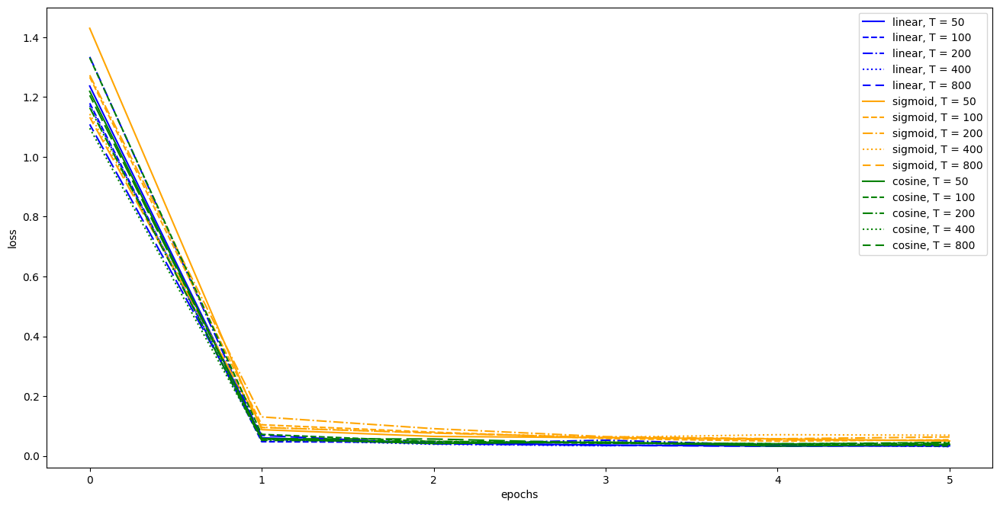

In [217]:
figure(figsize=(16, 8), dpi=100)
labels = ['T = 50', 'T = 100', 'T = 200', 'T = 400', 'T = 800']
colors = ['blue', 'orange', 'green']
linestyles = ['-', '--', '-.', ':', (5, (10, 3))]
for i, (schedule, v) in enumerate(losses.items()):
  for j, (T, loss_points) in enumerate(v.items()):
    # if j==4:
      plt.plot(loss_points, label='{}, T = {}'.format(schedule, T), color = colors[i], linestyle=linestyles[j])
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")

In [191]:
df = pd.DataFrame.from_dict(losses)

In [194]:
for i in df.values:
  print(i)

[list([1.2367408275604248, 0.06032858043909073, 0.04363419860601425, 0.036370787769556046, 0.03289904072880745, 0.03389753773808479])
 list([1.4297716617584229, 0.08783827722072601, 0.06520616263151169, 0.06102972477674484, 0.05678729712963104, 0.050060056149959564])
 list([1.2189915180206299, 0.05825793370604515, 0.04167633503675461, 0.046263642609119415, 0.03300534188747406, 0.03864859789609909])]
[list([1.179279088973999, 0.047496505081653595, 0.045225851237773895, 0.04454142972826958, 0.03710026293992996, 0.03177906572818756])
 list([1.2663536071777344, 0.10409678518772125, 0.0794469490647316, 0.058231111615896225, 0.04920712858438492, 0.05409400910139084])
 list([1.3311834335327148, 0.07208463549613953, 0.04801636189222336, 0.0421469509601593, 0.04044164717197418, 0.03365154564380646])]
[list([1.3341023921966553, 0.058224037289619446, 0.04083527624607086, 0.05259842053055763, 0.03585486486554146, 0.03411869704723358])
 list([1.2729873657226562, 0.13040781021118164, 0.0911015719175

## Generating samples for each model

In [14]:
@torch.no_grad()
def sample_timestep(model, x, t):
    """
    Calls the model to predict the noise in the image and returns 
    the denoised image. 
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x.shape)
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    
    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t)
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
    
    if t == 0:
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 1, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(num_images - i/stepsize))
            plt.title('t = {}'.format(i))
            #img2 = torch.clamp(img, 0, 1) # NEW
            show_tensor_image(img.detach().cpu())
    plt.show() 

In [16]:
schedules = ['linear', 'cosine', 'sigmoid']
Ts = [50, 100, 200, 400, 800]

for schedule in schedules:
  for T in Ts:

    # Define schedules
    start = (beta_min*1000)/T
    end = (beta_max*1000)/T
    if schedule == 'linear':
      function = linear_beta_schedule
      betas = function(timesteps=T, start=start, end=end)
    if schedule == 'sigmoid':
      function = sigmoid_beta_schedule
      betas = function(timesteps=T, start=start, end=end)
    if schedule == 'cosine':
      function = cosine_beta_schedule
      betas = function(timesteps=T, s=s)

    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
    sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

    model_name = 'model_attention_{}_{}.pth'.format(schedule, T)
    model = Unet(dim=16, channels=1, dim_mults=(1, 2, 4, 8))
    model = load_model(model, model_name)
    model = model.to(device)
    model.eval()
    print(model_name)
    print("Num params: ", sum(p.numel() for p in model.parameters()))
    print('Model loaded.')

    print('Start Generating :')
    dir = os.path.join('samples', model_name)
    os.makedirs(dir, exist_ok=True)
    with trange(32, desc="Generated", unit="img") as te:
        for idx in te:
            img = torch.randn((1, 1, IMG_SIZE, IMG_SIZE), device=device)
            for i in range(0,T)[::-1]: # from T-1 to 0
                t = torch.full((1,), i, device=device, dtype=torch.long)
                img = sample_timestep(model, img, t)
            img = img[:, :, 2:30, 2:30]
            # img = torch.clamp(img, 0, 1) # NEW
            torchvision.utils.save_image(img, os.path.join(dir, f'{idx}.png'))

model_attention_linear_50.pth
Num params:  3841879
Model loaded.
Start Generating :


Generated: 100%|██████████| 32/32 [00:36<00:00,  1.13s/img]


model_attention_linear_100.pth
Num params:  3841879
Model loaded.
Start Generating :


Generated: 100%|██████████| 32/32 [00:56<00:00,  1.77s/img]


model_attention_linear_200.pth
Num params:  3841879
Model loaded.
Start Generating :


Generated: 100%|██████████| 32/32 [01:44<00:00,  3.25s/img]


model_attention_linear_400.pth
Num params:  3841879
Model loaded.
Start Generating :


Generated: 100%|██████████| 32/32 [03:20<00:00,  6.26s/img]


model_attention_linear_800.pth
Num params:  3841879
Model loaded.
Start Generating :


Generated: 100%|██████████| 32/32 [06:34<00:00, 12.34s/img]


model_attention_cosine_50.pth
Num params:  3841879
Model loaded.
Start Generating :


Generated: 100%|██████████| 32/32 [00:32<00:00,  1.00s/img]


model_attention_cosine_100.pth
Num params:  3841879
Model loaded.
Start Generating :


Generated: 100%|██████████| 32/32 [00:54<00:00,  1.72s/img]


model_attention_cosine_200.pth
Num params:  3841879
Model loaded.
Start Generating :


Generated: 100%|██████████| 32/32 [01:43<00:00,  3.23s/img]


model_attention_cosine_400.pth
Num params:  3841879
Model loaded.
Start Generating :


Generated: 100%|██████████| 32/32 [03:22<00:00,  6.33s/img]


model_attention_cosine_800.pth
Num params:  3841879
Model loaded.
Start Generating :


Generated: 100%|██████████| 32/32 [06:37<00:00, 12.42s/img]


model_attention_sigmoid_50.pth
Num params:  3841879
Model loaded.
Start Generating :


Generated: 100%|██████████| 32/32 [00:31<00:00,  1.02img/s]


model_attention_sigmoid_100.pth
Num params:  3841879
Model loaded.
Start Generating :


Generated: 100%|██████████| 32/32 [00:58<00:00,  1.83s/img]


model_attention_sigmoid_200.pth
Num params:  3841879
Model loaded.
Start Generating :


Generated: 100%|██████████| 32/32 [01:44<00:00,  3.26s/img]


model_attention_sigmoid_400.pth
Num params:  3841879
Model loaded.
Start Generating :


Generated: 100%|██████████| 32/32 [03:21<00:00,  6.30s/img]


model_attention_sigmoid_800.pth
Num params:  3841879
Model loaded.
Start Generating :


Generated: 100%|██████████| 32/32 [06:36<00:00, 12.38s/img]
